# Produção Energética e Sustentabilidade

### Descrição

A energia solar é uma das principais fontes de energias renováveis, desempenhando não só um papel fundamental na transição para fontes de energia limpa e renovável, mas também na promoção da sustentabilidade ambiental. Nesse contexto, além de ser crucial otimizar o uso da energia solar, a relação entre o gasto e a produção energética é essencial para permitir um planeamento eficaz do consumo energético e a integração harmoniosa de sistemas de energia solar em redes elétricas existentes.

Nesse sentido, a 6ª Edição da Competição ML @SBS/DAA consiste no desenvolvimento de modelos de Machine Learning capazes de prever, com precisão, a quantidade de energia elétrica, em kWh, gerada por painéis solares e injectada na rede eléctrica existente a cada hora do dia com base numa ampla gama de atributos, que vão desde dados meteorológicos e informações geográficas, ao histórico de gasto e produção energética.

Este é, portanto, um problema de previsão de energia com impacto significativo na eficiência energética, mas também na redução das emissões de gases com efeito estufa e na promoção da sustentabilidade. Com isso em consideração, foi colecionado um dataset que contém diversos dados referentes à produção energética de determinados painéis solares na cidade de Braga (o dataset cobre um período que vai desde setembro de 2021 até abril de 2023).

### Objetivo

O objetivo de cada grupo de trabalho passa por desenvolver o melhor modelo possível capaz de prever a quantidade de energia, em kWh, produzida por painéis solares e injectada, em redes elétricas existentes, a cada hora do dia.

O dataset utilizado nesta competição contém um conjunto de features sendo de destacar a feature Injeção na rede (kWh) . Esta feature indica, numa escala qualitativa (None, Low, Medium, High e Very_High), a quantidade de energia que se injectou na rede elétrica num determinado ponto temporal (i.e., numa determinada hora de um determinado dia). Se o valor desta feature for None, significa que não foi injectada nenhuma energia na rede (ou porque nada foi obtido dos painéis solares, ou porque toda a energia produzida pelos painéis foi consumida localmente). Um valor de Very_High implica a existência de uma quantidade muito alta de energia injectada na rede eléctrica naquele ponto temporal.

Para treino e tuning dos modelos de Machine Learning ser-vos-ão disponibilizados dois datasets com dados energéticos e dois datasets com dados meteorológicos. Tantos os datasets energéticos como os meteorológicos estão divididos por data, i.e., um dos datasets cobre o período de 2021 enquanto que o outro cobre todo o ano de 2022. Os grupos de trabalho poderão adicionar aos datasets qualquer atributo que achem relevante.

Para obtenção de scores na competição, os grupos de trabalho deverão prever, para cada registo do dataset de teste ("energia_202301-202304.csv"), a quantidade de energia que se injectou na rede elétrica num determinado ponto temporal, utilizando a escala None, Low, Medium, High e Very_High.

### Os dados

São disponibilizados dois tipos de datasets, i.e., um tipo com dados energéticos e outro tipo com dados meteorológicos. Além disso, cada tipo de dataset está dividido por data, i.e., um dos datasets cobre o período de 2021 enquanto que o outro cobre todo o ano de 2022. Em resumo, são disponibilizados quatro datasets para treino e tuning dos modelos de Machine Learning

Features dos Datasets de Energia

- **Data** - o timestamp associado ao registo, ao dia;
- **Hora** - a hora associada ao registo;
- **Normal (kWh)** - quantidade de energia eléctrica consumida, em kWh e proveniente da rede eléctrica, num período considerado normal em ciclos bi-horário diários (horas fora de vazio);
- **Horário Económico (kWh)** - quantidade de energia eléctrica consumida, em kWh e proveniente da rede eléctrica, num período considerado económico em ciclos bi-horário diários (horas de vazio);
- **Autoconsumo (kWh)** - quantidade de energia eléctrica consumida, em kWh, proveniente dos painéis solares;
- **Injeção na rede (kWh)** - quantidade de energia eléctrica injectada na rede eléctrica, em kWh, proveniente dos painéis solares.

Features dos Datasets Meteorológicos

- **dt** - o timestamp associado ao registo;
- **dt_iso** - a data associada ao registo, ao segundo;
- **city_name** - o local em causa;
- **temp** - temperatura em ºC;
- **feels_like** - sensação térmica em ºC;
- **temp_min** - temperatura mínima sentida em ºC;
- **temp_max** - temperatura máxima sentida em ºC;
- **pressure** - pressão atmosférica sentida em atm;
- **sea_level** - pressão atmosférica sentida ao nível do mar em atm;
- **grnd_level** - pressão atmosférica sentida à altitude local em atm;
- **humidity** - humidade em percentagem;
- **wind_speed** - velocidade do vento em metros por segundo;
- **rain_1h** - valor médio de precipitação;
- **clouds_all** - nível de nebulosidade em percentagem;
- **weather_description** - avaliação qualitativa do estado do tempo.


## Importar Bibliotecas

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time 
#from imblearn.under_sampling import RandomUnderSampler

# Outras bibliotecas a importar mais tarde
%matplotlib inline

## Carregar os Datasets

In [4]:
energia2021 = pd.read_csv('datasets/energia_202109-202112.csv', encoding = "ISO-8859-1")
energia2022 = pd.read_csv('datasets/energia_202201-202212.csv', encoding = "ISO-8859-1")
energia2023 = pd.read_csv('datasets/energia_202301-202304.csv', encoding = "ISO-8859-1")

meteo2021 = pd.read_csv('datasets/meteo_202109-202112.csv')
meteo2022 = pd.read_csv('datasets/meteo_202201-202212.csv')
meteo2023 = pd.read_csv('datasets/meteo_202301-202304.csv')

radiation_data = pd.read_csv('datasets/radiation_data.csv')

Verificar as colunas de cada dataset

In [5]:
print(energia2021.columns)
print(energia2022.columns)
print(energia2023.columns)
print(meteo2021.columns)
print(meteo2022.columns)
print(meteo2023.columns)
print(radiation_data.columns)

Index(['Data', 'Hora', 'Normal (kWh)', 'Horário Económico (kWh)',
       'Autoconsumo (kWh)', 'Injeção na rede (kWh)'],
      dtype='object')
Index(['Data', 'Hora', 'Normal (kWh)', 'Horário Económico (kWh)',
       'Autoconsumo (kWh)', 'Injeção na rede (kWh)'],
      dtype='object')
Index(['Data', 'Hora', 'Normal (kWh)', 'Horário Económico (kWh)',
       'Autoconsumo (kWh)'],
      dtype='object')
Index(['dt', 'dt_iso', 'city_name', 'temp', 'feels_like', 'temp_min',
       'temp_max', 'pressure', 'sea_level', 'grnd_level', 'humidity',
       'wind_speed', 'rain_1h', 'clouds_all', 'weather_description'],
      dtype='object')
Index(['dt', 'dt_iso', 'city_name', 'temp', 'feels_like', 'temp_min',
       'temp_max', 'pressure', 'sea_level', 'grnd_level', 'humidity',
       'wind_speed', 'rain_1h', 'clouds_all', 'weather_description'],
      dtype='object')
Index(['dt', 'dt_iso', 'city_name', 'temp', 'feels_like', 'temp_min',
       'temp_max', 'pressure', 'sea_level', 'grnd_level', 'humidi

In [6]:
print(energia2021.info())
print()
print(energia2022.info())
print()
print(energia2023.info())
print()
print(meteo2021.info())
print()
print(meteo2022.info())
print()
print(meteo2023.info())
print()
print(radiation_data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2256 entries, 0 to 2255
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     2256 non-null   object 
 1   Hora                     2256 non-null   int64  
 2   Normal (kWh)             2256 non-null   float64
 3   Horário Económico (kWh)  2256 non-null   float64
 4   Autoconsumo (kWh)        2256 non-null   float64
 5   Injeção na rede (kWh)    566 non-null    object 
dtypes: float64(3), int64(1), object(2)
memory usage: 105.9+ KB
None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     8760 non-null   object 
 1   Hora                     8760 non-null   int64  
 2   Normal (kWh)             8760 non-null   float64
 3   Horário Eco

Conclusão: as colunas são as mesmas

Próximo passo: Concatenar os datasets

In [7]:
frames_energia = [energia2021, energia2022]
frames_meteo = [meteo2021, meteo2022]

energia = pd.concat(frames_energia)
meteo = pd.concat(frames_meteo)

meteo.rename(columns={'dt': 'Timestamp','dt_iso':'Data', 'city_name':'Nome da Cidade', 'temp':'Temperatura (ºC)', 'feels_like': 'Sensação Térmica (ºC)', 'temp_min': 'Temperatura Mínima (ºC)', 'temp_max': 'Temperatura Máxima (ºC)', 'pressure': 'Pressão Atmosférica (atm)', 'sea_level': 'Pressão atmosférica no nível do mar (atm)', 'grnd_level': 'Pressão atmosférica na altitude local (atm)', 'humidity': 'Humidade (%)', 'wind_speed': 'Velocidade do vento (m/s)', 'rain_1h': 'Valor médio de precipitação', 'clouds_all': 'Nível de nebulosidade (%)', 'weather_description': 'Avaliação qualitativa do estado do tempo'}, inplace=True)


Verificar o tamanho dos dados depois da concatenação, a presença de missing values e os tipos de dados

In [8]:
print(energia.info())
print()
print(meteo.info())

<class 'pandas.core.frame.DataFrame'>
Index: 11016 entries, 0 to 8759
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     11016 non-null  object 
 1   Hora                     11016 non-null  int64  
 2   Normal (kWh)             11016 non-null  float64
 3   Horário Económico (kWh)  11016 non-null  float64
 4   Autoconsumo (kWh)        11016 non-null  float64
 5   Injeção na rede (kWh)    3239 non-null   object 
dtypes: float64(3), int64(1), object(2)
memory usage: 602.4+ KB
None

<class 'pandas.core.frame.DataFrame'>
Index: 11688 entries, 0 to 8759
Data columns (total 15 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Timestamp                                    11688 non-null  int64  
 1   Data                                         11688 non-null  objec

In [9]:
meteo

,Timestamp,Data,Nome da Cidade,Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Pressão atmosférica no nível do mar (atm),Pressão atmosférica na altitude local (atm),Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo
0,1630454400,2021-09-01 00:00:00 +0000 UTC,local,18.74,18.84,15.72,20.34,1015,NaN,NaN,83,1.18,NaN,78,broken clouds
1,1630458000,2021-09-01 01:00:00 +0000 UTC,local,18.73,18.83,15.72,20.34,1014,NaN,NaN,83,1.46,NaN,92,overcast clouds
2,1630461600,2021-09-01 02:00:00 +0000 UTC,local,17.84,17.98,16.72,20.34,1014,NaN,NaN,88,1.05,NaN,91,overcast clouds
3,1630465200,2021-09-01 03:00:00 +0000 UTC,local,18.27,18.40,16.68,20.34,1014,NaN,NaN,86,0.46,0.14,94,light rain
4,1630468800,2021-09-01 04:00:00 +0000 UTC,local,17.81,17.97,16.12,20.34,1013,NaN,NaN,89,0.93,1.26,95,moderate rain
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,1672513200,2022-12-31 19:00:00 +0000 UTC,local,15.70,15.57,15.57,15.72,1018,NaN,NaN,86,5.56,3.58,100,moderate rain
8756,1672516800,2022-12-31 20:00:00 +0000 UTC,local,15.55,15.43,12.72,15.70,1018,NaN,NaN,87,4.47,4.20,100,heavy intensity rain
8757,1672520400,2022-12-31 21:00:00 +0000 UTC,local,13.45,13.28,12.23,13.99,1019,NaN,NaN,93,3.29,4.23,100,heavy intensity rain
8758,1672524000,2022-12-31 22:00:00 +0000 UTC,local,12.93,12.73,12.23,13.43,1019,NaN,NaN,94,1.49,3.90,100,moderate rain


In [10]:
energia

,Data,Hora,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh)
0,2021-09-29,0,0.000,0.000,0.0,NaN
1,2021-09-29,1,0.000,0.000,0.0,NaN
2,2021-09-29,2,0.000,0.000,0.0,NaN
3,2021-09-29,3,0.000,0.000,0.0,NaN
4,2021-09-29,4,0.000,0.000,0.0,NaN
...,...,...,...,...,...,...
8755,2022-12-31,19,1.693,0.000,0.0,NaN
8756,2022-12-31,20,1.327,0.000,0.0,NaN
8757,2022-12-31,21,0.757,0.000,0.0,NaN
8758,2022-12-31,22,0.000,0.675,0.0,NaN


Juntar num único dataset. Precisamos de agrupar os dados metereológicos às medições de energia correspondentes.
Agrupar por Data e Hora.

In [11]:
meteo['Data'] = pd.to_datetime(meteo['Data'], format='%Y-%m-%d %H:%M:%S +0000 UTC', errors='coerce') # 2021-09-01 00:00:00 +0000 UTC
meteo.head()

,Timestamp,Data,Nome da Cidade,Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Pressão atmosférica no nível do mar (atm),Pressão atmosférica na altitude local (atm),Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo
0,1630454400,2021-09-01 00:00:00,local,18.74,18.84,15.72,20.34,1015,NaN,NaN,83,1.18,NaN,78,broken clouds
1,1630458000,2021-09-01 01:00:00,local,18.73,18.83,15.72,20.34,1014,NaN,NaN,83,1.46,NaN,92,overcast clouds
2,1630461600,2021-09-01 02:00:00,local,17.84,17.98,16.72,20.34,1014,NaN,NaN,88,1.05,NaN,91,overcast clouds
3,1630465200,2021-09-01 03:00:00,local,18.27,18.40,16.68,20.34,1014,NaN,NaN,86,0.46,0.14,94,light rain
4,1630468800,2021-09-01 04:00:00,local,17.81,17.97,16.12,20.34,1013,NaN,NaN,89,0.93,1.26,95,moderate rain


In [12]:
radiation_data['Data'] = pd.to_datetime(radiation_data['time'], format='%Y-%m-%d %H:%M:%S +0000 UTC', errors='coerce') # 2021-09-01 00:00:00 +0000 UTC
radiation_data.drop(['time'], axis=1, inplace=True)

In [13]:
radiation_data.head()

,shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²),Data
0,0.0,0.0,0.0,0.0,0.0,2021-09-01 00:00:00
1,0.0,0.0,0.0,0.0,0.0,2021-09-01 01:00:00
2,0.0,0.0,0.0,0.0,0.0,2021-09-01 02:00:00
3,0.0,0.0,0.0,0.0,0.0,2021-09-01 03:00:00
4,0.0,0.0,0.0,0.0,0.0,2021-09-01 04:00:00


In [14]:
energia['Data'] = pd.to_datetime(energia.apply(lambda row: f"{row['Data']} {row['Hora']}", axis=1), format='%Y-%m-%d %H', errors='coerce') 
energia.drop('Hora', axis=1, inplace=True)
energia.head()

,Data,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh)
0,2021-09-29 00:00:00,0.0,0.0,0.0,NaN
1,2021-09-29 01:00:00,0.0,0.0,0.0,NaN
2,2021-09-29 02:00:00,0.0,0.0,0.0,NaN
3,2021-09-29 03:00:00,0.0,0.0,0.0,NaN
4,2021-09-29 04:00:00,0.0,0.0,0.0,NaN


### Merge aos três datasets

In [15]:
data = pd.merge(energia, meteo, how = 'left', on = 'Data')
data

,Data,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Timestamp,Nome da Cidade,Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Pressão atmosférica no nível do mar (atm),Pressão atmosférica na altitude local (atm),Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo
0,2021-09-29 00:00:00,0.000,0.000,0.0,NaN,1632873600,local,13.97,13.54,11.45,14.04,1027,NaN,NaN,81,1.96,NaN,87,overcast clouds
1,2021-09-29 01:00:00,0.000,0.000,0.0,NaN,1632877200,local,13.48,13.02,13.43,13.90,1028,NaN,NaN,82,1.83,NaN,91,overcast clouds
2,2021-09-29 02:00:00,0.000,0.000,0.0,NaN,1632880800,local,12.93,12.47,12.72,13.43,1027,NaN,NaN,84,1.96,NaN,93,overcast clouds
3,2021-09-29 03:00:00,0.000,0.000,0.0,NaN,1632884400,local,12.61,12.15,10.34,12.93,1027,NaN,NaN,85,1.85,NaN,95,overcast clouds
4,2021-09-29 04:00:00,0.000,0.000,0.0,NaN,1632888000,local,12.61,12.17,9.79,12.93,1027,NaN,NaN,86,1.83,NaN,93,overcast clouds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,2022-12-31 19:00:00,1.693,0.000,0.0,NaN,1672513200,local,15.70,15.57,15.57,15.72,1018,NaN,NaN,86,5.56,3.58,100,moderate rain
11012,2022-12-31 20:00:00,1.327,0.000,0.0,NaN,1672516800,local,15.55,15.43,12.72,15.70,1018,NaN,NaN,87,4.47,4.20,100,heavy intensity rain
11013,2022-12-31 21:00:00,0.757,0.000,0.0,NaN,1672520400,local,13.45,13.28,12.23,13.99,1019,NaN,NaN,93,3.29,4.23,100,heavy intensity rain
11014,2022-12-31 22:00:00,0.000,0.675,0.0,NaN,1672524000,local,12.93,12.73,12.23,13.43,1019,NaN,NaN,94,1.49,3.90,100,moderate rain


In [16]:
data = pd.merge(data, radiation_data, how = 'left', on = 'Data')
data

,Data,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Timestamp,Nome da Cidade,Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),...,Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo,shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²)
0,2021-09-29 00:00:00,0.000,0.000,0.0,NaN,1632873600,local,13.97,13.54,11.45,...,81,1.96,NaN,87,overcast clouds,0.0,0.0,0.0,0.0,0.0
1,2021-09-29 01:00:00,0.000,0.000,0.0,NaN,1632877200,local,13.48,13.02,13.43,...,82,1.83,NaN,91,overcast clouds,0.0,0.0,0.0,0.0,0.0
2,2021-09-29 02:00:00,0.000,0.000,0.0,NaN,1632880800,local,12.93,12.47,12.72,...,84,1.96,NaN,93,overcast clouds,0.0,0.0,0.0,0.0,0.0
3,2021-09-29 03:00:00,0.000,0.000,0.0,NaN,1632884400,local,12.61,12.15,10.34,...,85,1.85,NaN,95,overcast clouds,0.0,0.0,0.0,0.0,0.0
4,2021-09-29 04:00:00,0.000,0.000,0.0,NaN,1632888000,local,12.61,12.17,9.79,...,86,1.83,NaN,93,overcast clouds,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,2022-12-31 19:00:00,1.693,0.000,0.0,NaN,1672513200,local,15.70,15.57,15.57,...,86,5.56,3.58,100,moderate rain,0.0,0.0,0.0,0.0,0.0
11012,2022-12-31 20:00:00,1.327,0.000,0.0,NaN,1672516800,local,15.55,15.43,12.72,...,87,4.47,4.20,100,heavy intensity rain,0.0,0.0,0.0,0.0,0.0
11013,2022-12-31 21:00:00,0.757,0.000,0.0,NaN,1672520400,local,13.45,13.28,12.23,...,93,3.29,4.23,100,heavy intensity rain,0.0,0.0,0.0,0.0,0.0
11014,2022-12-31 22:00:00,0.000,0.675,0.0,NaN,1672524000,local,12.93,12.73,12.23,...,94,1.49,3.90,100,moderate rain,0.0,0.0,0.0,0.0,0.0


In [17]:
data.columns

Index(['Data', 'Normal (kWh)', 'Horário Económico (kWh)', 'Autoconsumo (kWh)',
       'Injeção na rede (kWh)', 'Timestamp', 'Nome da Cidade',
       'Temperatura (ºC)', 'Sensação Térmica (ºC)', 'Temperatura Mínima (ºC)',
       'Temperatura Máxima (ºC)', 'Pressão Atmosférica (atm)',
       'Pressão atmosférica no nível do mar (atm)',
       'Pressão atmosférica na altitude local (atm)', 'Humidade (%)',
       'Velocidade do vento (m/s)', 'Valor médio de precipitação',
       'Nível de nebulosidade (%)', 'Avaliação qualitativa do estado do tempo',
       'shortwave_radiation (W/m²)', 'direct_radiation (W/m²)',
       'diffuse_radiation (W/m²)', 'direct_normal_irradiance (W/m²)',
       'terrestrial_radiation (W/m²)'],
      dtype='object')

In [18]:
data.duplicated().sum()

0

### Verificação da coluna Timestamp e Nome da Cidade

In [19]:
data['Timestamp'].value_counts()

Timestamp
1632873600    1
1659322800    1
1659294000    1
1659297600    1
1659301200    1
             ..
1646096400    1
1646100000    1
1646103600    1
1646107200    1
1672527600    1
Name: count, Length: 11016, dtype: int64

In [20]:
data['Nome da Cidade'].value_counts()

Nome da Cidade
local    11016
Name: count, dtype: int64

Uma vez que a coluna 'Timestamp' apenas tem valores distintos e a coluna 'Nome da Cidade' tem sempre o mesmo valor, podemos removar ambas as colunas

In [21]:
data.drop(['Timestamp', 'Nome da Cidade'], axis=1, inplace=True)

In [22]:
data

,Data,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),...,Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo,shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²)
0,2021-09-29 00:00:00,0.000,0.000,0.0,NaN,13.97,13.54,11.45,14.04,1027,...,81,1.96,NaN,87,overcast clouds,0.0,0.0,0.0,0.0,0.0
1,2021-09-29 01:00:00,0.000,0.000,0.0,NaN,13.48,13.02,13.43,13.90,1028,...,82,1.83,NaN,91,overcast clouds,0.0,0.0,0.0,0.0,0.0
2,2021-09-29 02:00:00,0.000,0.000,0.0,NaN,12.93,12.47,12.72,13.43,1027,...,84,1.96,NaN,93,overcast clouds,0.0,0.0,0.0,0.0,0.0
3,2021-09-29 03:00:00,0.000,0.000,0.0,NaN,12.61,12.15,10.34,12.93,1027,...,85,1.85,NaN,95,overcast clouds,0.0,0.0,0.0,0.0,0.0
4,2021-09-29 04:00:00,0.000,0.000,0.0,NaN,12.61,12.17,9.79,12.93,1027,...,86,1.83,NaN,93,overcast clouds,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,2022-12-31 19:00:00,1.693,0.000,0.0,NaN,15.70,15.57,15.57,15.72,1018,...,86,5.56,3.58,100,moderate rain,0.0,0.0,0.0,0.0,0.0
11012,2022-12-31 20:00:00,1.327,0.000,0.0,NaN,15.55,15.43,12.72,15.70,1018,...,87,4.47,4.20,100,heavy intensity rain,0.0,0.0,0.0,0.0,0.0
11013,2022-12-31 21:00:00,0.757,0.000,0.0,NaN,13.45,13.28,12.23,13.99,1019,...,93,3.29,4.23,100,heavy intensity rain,0.0,0.0,0.0,0.0,0.0
11014,2022-12-31 22:00:00,0.000,0.675,0.0,NaN,12.93,12.73,12.23,13.43,1019,...,94,1.49,3.90,100,moderate rain,0.0,0.0,0.0,0.0,0.0


Divisão da coluna Data

In [23]:
data['Year'] = data['Data'].dt.year
data['Month'] = data['Data'].dt.month
data['Day'] = data['Data'].dt.day
data['Hour'] = data['Data'].dt.hour
data['Minute'] = data['Data'].dt.minute
data['Seconds'] = data['Data'].dt.second

data.drop(['Data'], axis=1, inplace=True)

In [24]:
data

,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Pressão atmosférica no nível do mar (atm),...,direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²),Year,Month,Day,Hour,Minute,Seconds
0,0.000,0.000,0.0,NaN,13.97,13.54,11.45,14.04,1027,NaN,...,0.0,0.0,0.0,0.0,2021,9,29,0,0,0
1,0.000,0.000,0.0,NaN,13.48,13.02,13.43,13.90,1028,NaN,...,0.0,0.0,0.0,0.0,2021,9,29,1,0,0
2,0.000,0.000,0.0,NaN,12.93,12.47,12.72,13.43,1027,NaN,...,0.0,0.0,0.0,0.0,2021,9,29,2,0,0
3,0.000,0.000,0.0,NaN,12.61,12.15,10.34,12.93,1027,NaN,...,0.0,0.0,0.0,0.0,2021,9,29,3,0,0
4,0.000,0.000,0.0,NaN,12.61,12.17,9.79,12.93,1027,NaN,...,0.0,0.0,0.0,0.0,2021,9,29,4,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,1.693,0.000,0.0,NaN,15.70,15.57,15.57,15.72,1018,NaN,...,0.0,0.0,0.0,0.0,2022,12,31,19,0,0
11012,1.327,0.000,0.0,NaN,15.55,15.43,12.72,15.70,1018,NaN,...,0.0,0.0,0.0,0.0,2022,12,31,20,0,0
11013,0.757,0.000,0.0,NaN,13.45,13.28,12.23,13.99,1019,NaN,...,0.0,0.0,0.0,0.0,2022,12,31,21,0,0
11014,0.000,0.675,0.0,NaN,12.93,12.73,12.23,13.43,1019,NaN,...,0.0,0.0,0.0,0.0,2022,12,31,22,0,0


In [25]:
print(data['Minute'].value_counts())
print(data['Seconds'].value_counts())

Minute
0    11016
Name: count, dtype: int64
Seconds
0    11016
Name: count, dtype: int64


Como os campos 'Minute' e 'Seconds' tem todos o mesmo valor, vamos remover estes campos.

In [26]:
data.drop(['Minute', 'Seconds'], axis=1, inplace=True)

In [27]:
data

,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Pressão atmosférica no nível do mar (atm),...,Avaliação qualitativa do estado do tempo,shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²),Year,Month,Day,Hour
0,0.000,0.000,0.0,NaN,13.97,13.54,11.45,14.04,1027,NaN,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,0
1,0.000,0.000,0.0,NaN,13.48,13.02,13.43,13.90,1028,NaN,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,1
2,0.000,0.000,0.0,NaN,12.93,12.47,12.72,13.43,1027,NaN,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,2
3,0.000,0.000,0.0,NaN,12.61,12.15,10.34,12.93,1027,NaN,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,3
4,0.000,0.000,0.0,NaN,12.61,12.17,9.79,12.93,1027,NaN,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,1.693,0.000,0.0,NaN,15.70,15.57,15.57,15.72,1018,NaN,...,moderate rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,19
11012,1.327,0.000,0.0,NaN,15.55,15.43,12.72,15.70,1018,NaN,...,heavy intensity rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,20
11013,0.757,0.000,0.0,NaN,13.45,13.28,12.23,13.99,1019,NaN,...,heavy intensity rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,21
11014,0.000,0.675,0.0,NaN,12.93,12.73,12.23,13.43,1019,NaN,...,moderate rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,22


### Preparação e Transformação dos Dados

Verificar missing values

<Axes: >

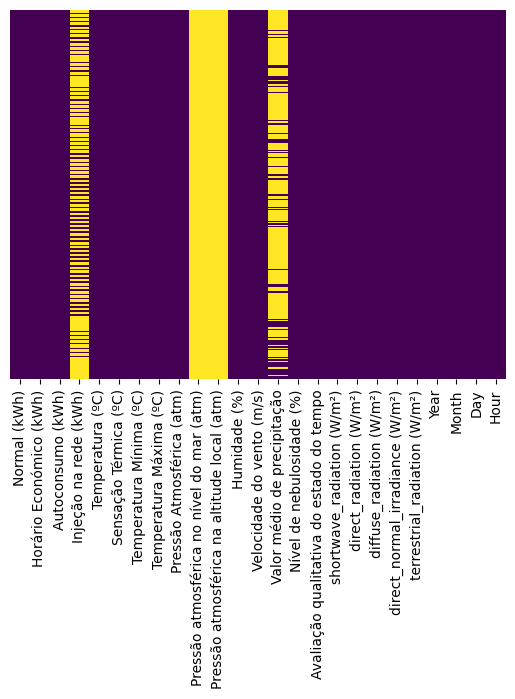

In [28]:
sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

Retirar colunas 'Pressão atmosférica no nível do mar(atm)' e 'Pressão atmosférica na altitude local(atm)'
 (Todos os valores são MV)


<Axes: >

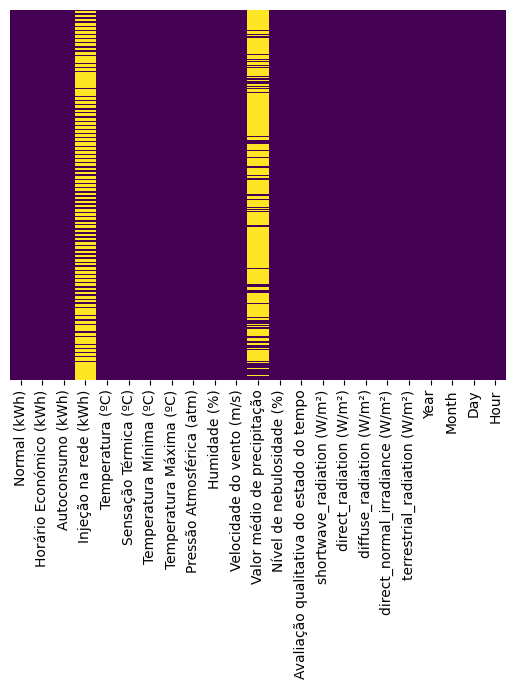

In [29]:
data.drop(['Pressão atmosférica no nível do mar (atm)', 'Pressão atmosférica na altitude local (atm)'], axis=1, inplace=True)
sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

Tratamento da coluna 'Valor médio de precipitação'

In [30]:
data['Valor médio de precipitação'].value_counts()

Valor médio de precipitação
0.12    69
0.16    57
0.15    54
0.14    54
0.11    51
        ..
6.36     1
3.54     1
3.89     1
3.65     1
4.07     1
Name: count, Length: 367, dtype: int64

<Axes: >

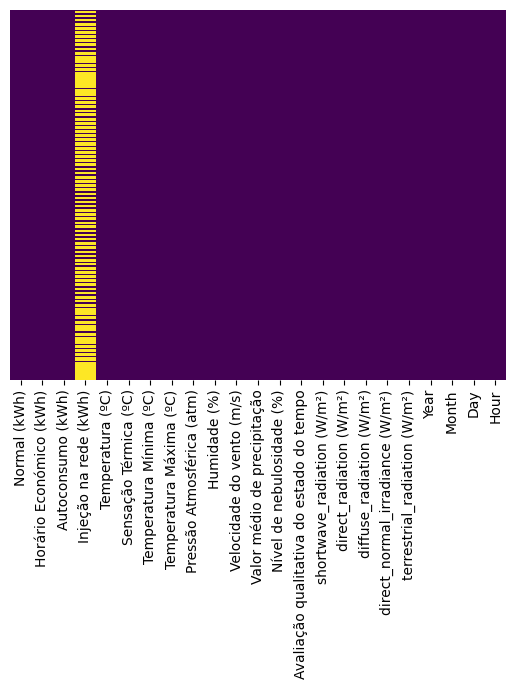

In [31]:
data['Valor médio de precipitação'] = data['Valor médio de precipitação'].fillna(0)
sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

Tratamento da coluna 'Injeção na rede(kWh)'

In [32]:
data['Injeção na rede (kWh)'].value_counts()

Injeção na rede (kWh)
High         1103
Medium       1098
Very High     606
Low           432
Name: count, dtype: int64

Valores 'None' estão a ser tratados como MV

<Axes: >

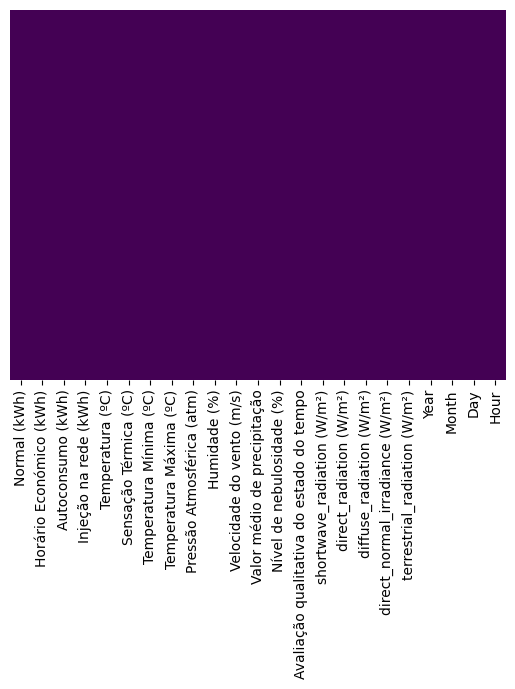

In [33]:
data['Injeção na rede (kWh)'] = data['Injeção na rede (kWh)'].fillna('None')
sns.heatmap(data.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [34]:
data

,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Humidade (%),...,Avaliação qualitativa do estado do tempo,shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²),Year,Month,Day,Hour
0,0.000,0.000,0.0,None,13.97,13.54,11.45,14.04,1027,81,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,0
1,0.000,0.000,0.0,None,13.48,13.02,13.43,13.90,1028,82,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,1
2,0.000,0.000,0.0,None,12.93,12.47,12.72,13.43,1027,84,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,2
3,0.000,0.000,0.0,None,12.61,12.15,10.34,12.93,1027,85,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,3
4,0.000,0.000,0.0,None,12.61,12.17,9.79,12.93,1027,86,...,overcast clouds,0.0,0.0,0.0,0.0,0.0,2021,9,29,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,1.693,0.000,0.0,None,15.70,15.57,15.57,15.72,1018,86,...,moderate rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,19
11012,1.327,0.000,0.0,None,15.55,15.43,12.72,15.70,1018,87,...,heavy intensity rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,20
11013,0.757,0.000,0.0,None,13.45,13.28,12.23,13.99,1019,93,...,heavy intensity rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,21
11014,0.000,0.675,0.0,None,12.93,12.73,12.23,13.43,1019,94,...,moderate rain,0.0,0.0,0.0,0.0,0.0,2022,12,31,22


### Analisar os dados

Analisar os valores para a coluna temp

Histograma 

<Axes: >

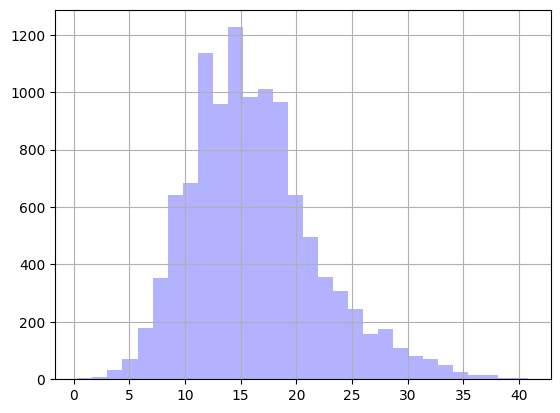

In [35]:
data['Temperatura (ºC)'].hist(bins=30, color='blue', alpha=0.3)

In [36]:
data['Avaliação qualitativa do estado do tempo'].value_counts()

Avaliação qualitativa do estado do tempo
sky is clear            3010
overcast clouds         2430
light rain              1662
broken clouds           1413
scattered clouds        1148
few clouds               731
moderate rain            562
heavy intensity rain      60
Name: count, dtype: int64

Agrupar pela avaliação qualitativa do estado do tempo

In [37]:
by_temp = data['Temperatura (ºC)'].groupby(data['Avaliação qualitativa do estado do tempo'])
print(by_temp.count())
print()
print(by_temp.mean())

Avaliação qualitativa do estado do tempo
broken clouds           1413
few clouds               731
heavy intensity rain      60
light rain              1662
moderate rain            562
overcast clouds         2430
scattered clouds        1148
sky is clear            3010
Name: Temperatura (ºC), dtype: int64

Avaliação qualitativa do estado do tempo
broken clouds           16.437657
few clouds              16.522763
heavy intensity rain    16.244333
light rain              14.994771
moderate rain           15.027740
overcast clouds         15.416708
scattered clouds        16.949408
sky is clear            17.177807
Name: Temperatura (ºC), dtype: float64


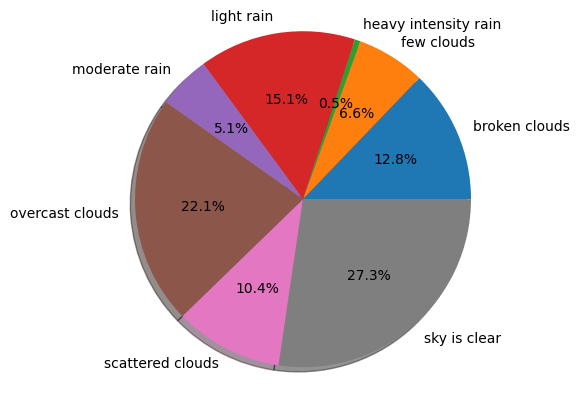

In [38]:
labels = data['Avaliação qualitativa do estado do tempo'].astype('category').cat.categories.tolist()
counts = data['Avaliação qualitativa do estado do tempo'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True)
ax1.axis('equal')
plt.show()

Histograma referente à variável 'Injeção na Rede'

<Axes: >

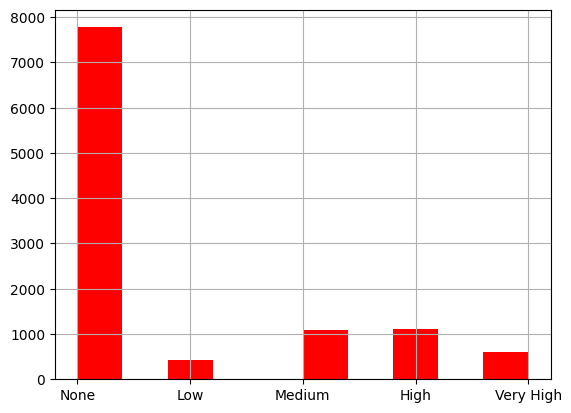

In [39]:
data['Injeção na rede (kWh)'].hist(color='red')

In [40]:
data.groupby(by=['Injeção na rede (kWh)']).mean(numeric_only=True)

,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Humidade (%),Velocidade do vento (m/s),...,Nível de nebulosidade (%),shortwave_radiation (W/m²),direct_radiation (W/m²),diffuse_radiation (W/m²),direct_normal_irradiance (W/m²),terrestrial_radiation (W/m²),Year,Month,Day,Hour
Injeção na rede (kWh),,,,,,,,,,,,,,,,,,,,,
High,0.024011,0.000000,0.348349,20.608930,20.344406,17.740716,21.911568,1019.290118,59.620127,2.816818,...,37.265639,509.278332,382.198549,127.079782,649.626927,800.298731,2021.812330,6.904805,15.473255,12.528558
Low,0.191738,0.006877,0.247236,17.331551,17.073519,15.325185,18.372940,1018.199074,74.518519,3.024583,...,61.261574,225.949074,119.789352,106.159722,294.611574,543.925926,2021.747685,7.324074,15.738426,12.333333
Medium,0.109224,0.000125,0.358899,18.460783,18.124362,16.075364,19.566557,1018.417122,68.272313,2.954936,...,52.997268,360.260474,235.567395,124.693078,466.114845,669.433971,2021.834244,6.936248,15.532787,12.340619
None,0.256983,0.225833,0.030516,14.575590,14.169321,12.889850,15.558395,1018.278128,82.011444,2.600837,...,58.059920,37.248039,18.783078,18.464961,58.055471,104.501980,2021.782693,7.629934,15.942008,11.112768
Very High,0.000820,0.000000,0.280363,23.809653,23.824719,20.279257,26.168977,1018.394389,54.099010,2.558383,...,29.013201,731.082508,602.013201,129.069307,784.094554,1028.703135,2021.887789,6.854785,15.171617,12.480198


Método de Pearson

<Axes: >

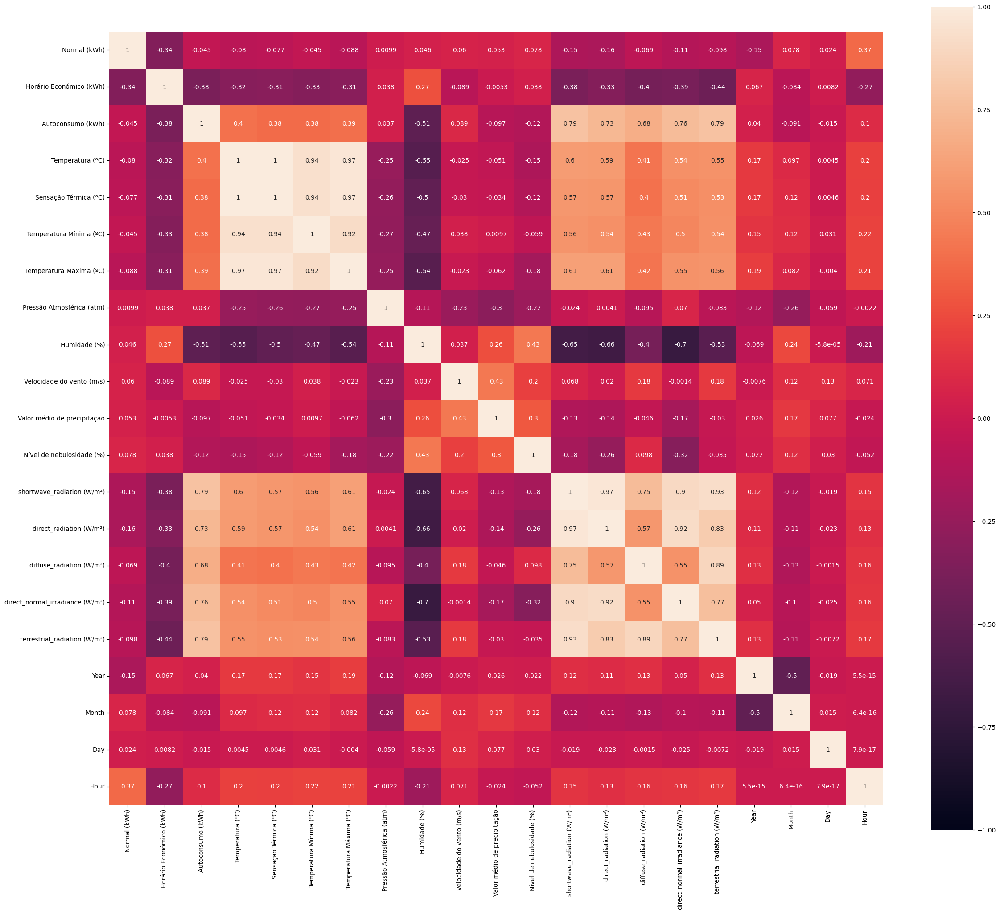

In [42]:
# Pearson Method
corr_matrix = data.corr(method='pearson', numeric_only=True)
f, ax = plt.subplots(figsize=(28, 24))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)

Variáveis de radiation muito correlacionadas entre si

-> Remover para simplificar análise

In [48]:
data.drop(['direct_radiation (W/m²)', 'diffuse_radiation (W/m²)','direct_normal_irradiance (W/m²)','terrestrial_radiation (W/m²)'], axis=1, inplace=True)

Método de Spearman

<Axes: >

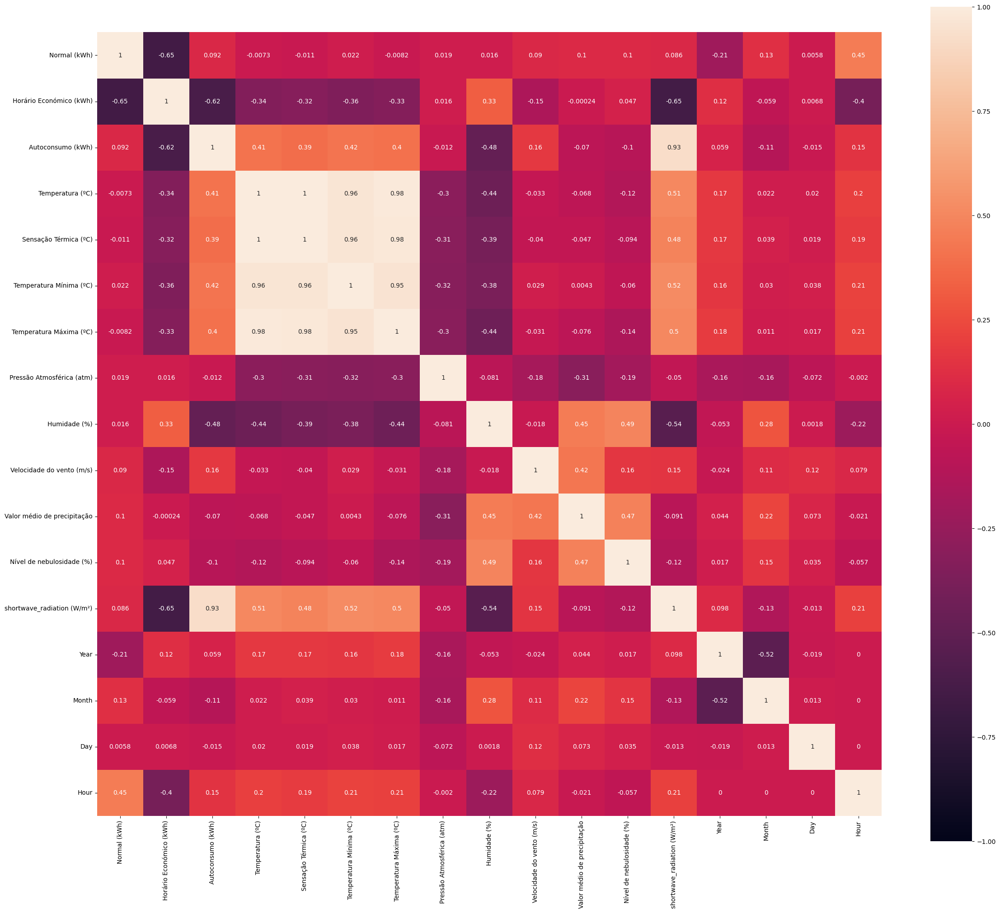

In [49]:
# Spearman method
corr_matrix = data.corr(method='spearman', numeric_only=True)
f, ax = plt.subplots(figsize=(28, 24))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)

Método de Kendall

<Axes: >

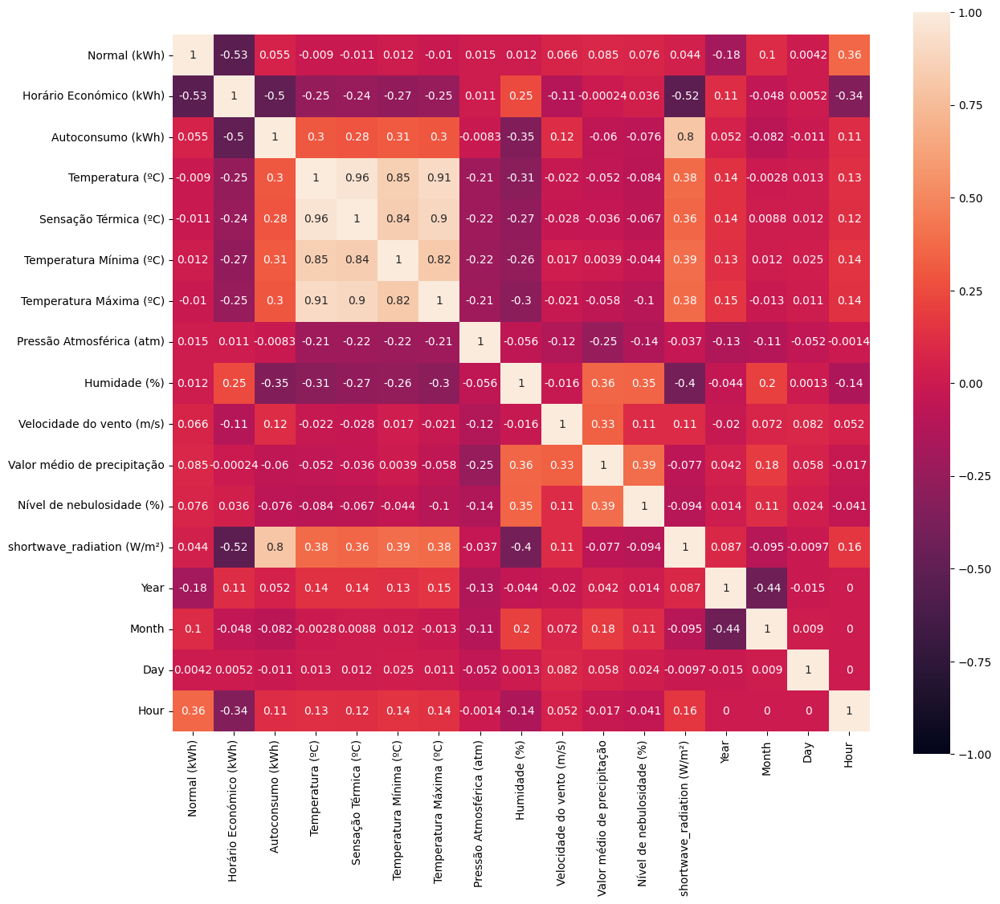

In [51]:
# Kendall method
corr_matrix = data.corr(method='kendall', numeric_only=True)
f, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)

## Outliers

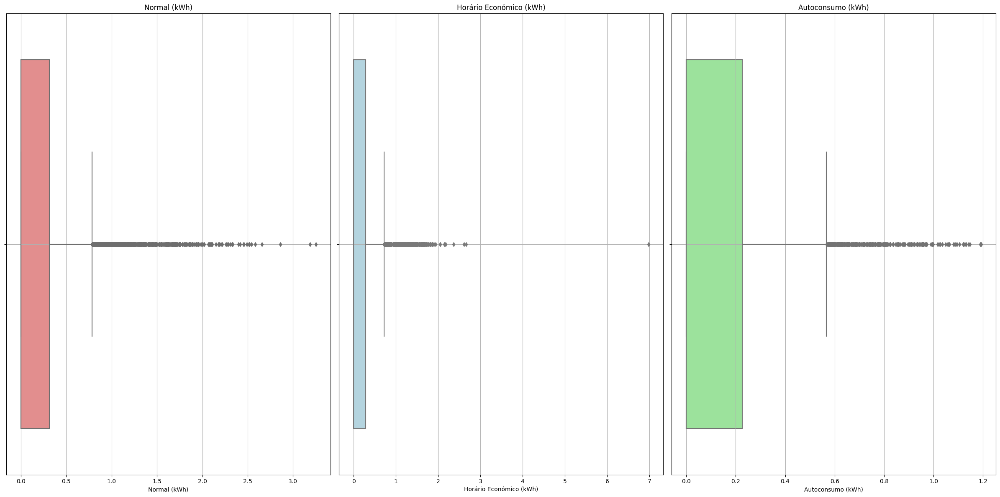

In [60]:
plt.figure(figsize=(24, 12))

# Plot the first boxplot
plt.subplot(1, 3, 1)  # Subplot 1 out of 3
sns.boxplot(x=data['Normal (kWh)'], color='lightcoral')
plt.title('Normal (kWh)')
plt.grid(True)

# Plot the second boxplot
plt.subplot(1, 3, 2)  # Subplot 2 out of 3
sns.boxplot(x=data['Horário Económico (kWh)'], color='lightblue')
plt.title('Horário Económico (kWh)')
plt.grid(True)

# Plot the third boxplot
plt.subplot(1, 3, 3)  # Subplot 3 out of 3
sns.boxplot(x=data['Autoconsumo (kWh)'], color='lightgreen')
plt.title('Autoconsumo (kWh)')
plt.grid(True)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

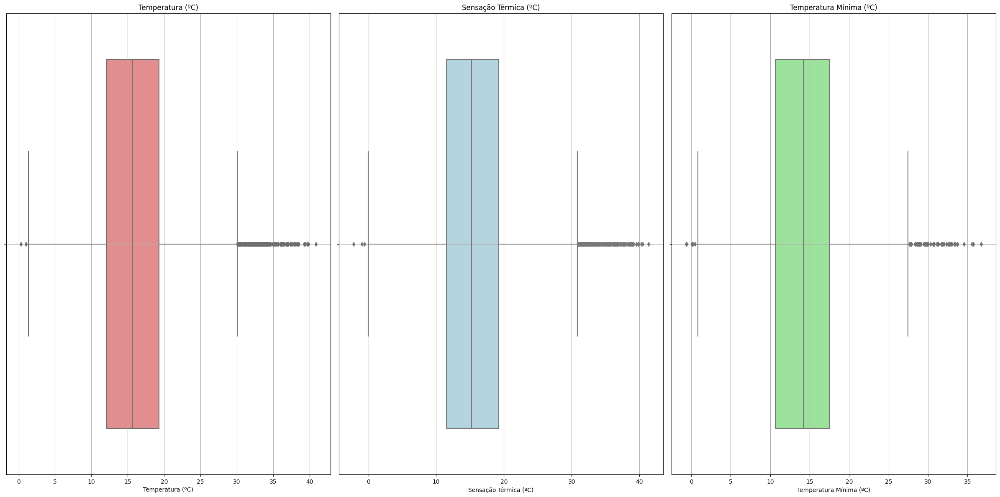

In [61]:
plt.figure(figsize=(24, 12))

# Plot the first boxplot
plt.subplot(1, 3, 1)  # Subplot 1 out of 3
sns.boxplot(x=data['Temperatura (ºC)'], color='lightcoral')
plt.title('Temperatura (ºC)')
plt.grid(True)

# Plot the second boxplot
plt.subplot(1, 3, 2)  # Subplot 2 out of 3
sns.boxplot(x=data['Sensação Térmica (ºC)'], color='lightblue')
plt.title('Sensação Térmica (ºC)')
plt.grid(True)

# Plot the third boxplot
plt.subplot(1, 3, 3)  # Subplot 3 out of 3
sns.boxplot(x=data['Temperatura Mínima (ºC)'], color='lightgreen')
plt.title('Temperatura Mínima (ºC)')
plt.grid(True)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

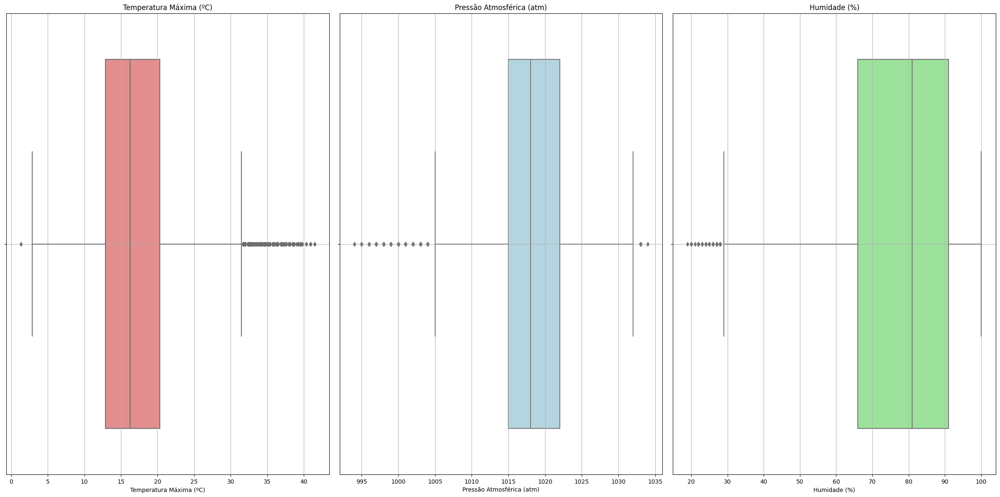

In [63]:
plt.figure(figsize=(24, 12))

# Plot the first boxplot
plt.subplot(1, 3, 1)  # Subplot 1 out of 3
sns.boxplot(x=data['Temperatura Máxima (ºC)'], color='lightcoral')
plt.title('Temperatura Máxima (ºC)')
plt.grid(True)

# Plot the second boxplot
plt.subplot(1, 3, 2)  # Subplot 2 out of 3
sns.boxplot(x=data['Pressão Atmosférica (atm)'], color='lightblue')
plt.title('Pressão Atmosférica (atm)')
plt.grid(True)

# Plot the third boxplot
plt.subplot(1, 3, 3)  # Subplot 3 out of 3
sns.boxplot(x=data['Humidade (%)'], color='lightgreen')
plt.title('Humidade (%)')
plt.grid(True)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

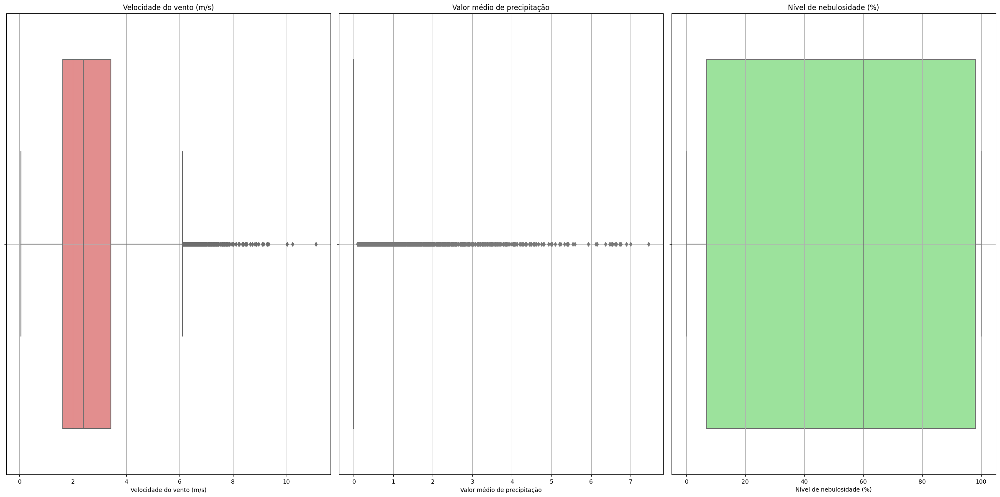

In [65]:
plt.figure(figsize=(24, 12))

# Plot the first boxplot
plt.subplot(1, 3, 1)  # Subplot 1 out of 3
sns.boxplot(x=data['Velocidade do vento (m/s)'], color='lightcoral')
plt.title('Velocidade do vento (m/s)')
plt.grid(True)

# Plot the second boxplot
plt.subplot(1, 3, 2)  # Subplot 2 out of 3
sns.boxplot(x=data['Valor médio de precipitação'], color='lightblue')
plt.title('Valor médio de precipitação')
plt.grid(True)

# Plot the third boxplot
plt.subplot(1, 3, 3)  # Subplot 3 out of 3
sns.boxplot(x=data['Nível de nebulosidade (%)'], color='lightgreen')
plt.title('Nível de nebulosidade (%)')
plt.grid(True)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [66]:
data.columns

Index(['Normal (kWh)', 'Horário Económico (kWh)', 'Autoconsumo (kWh)',
       'Injeção na rede (kWh)', 'Temperatura (ºC)', 'Sensação Térmica (ºC)',
       'Temperatura Mínima (ºC)', 'Temperatura Máxima (ºC)',
       'Pressão Atmosférica (atm)', 'Humidade (%)',
       'Velocidade do vento (m/s)', 'Valor médio de precipitação',
       'Nível de nebulosidade (%)', 'Avaliação qualitativa do estado do tempo',
       'shortwave_radiation (W/m²)', 'Year', 'Month', 'Day', 'Hour'],
      dtype='object')

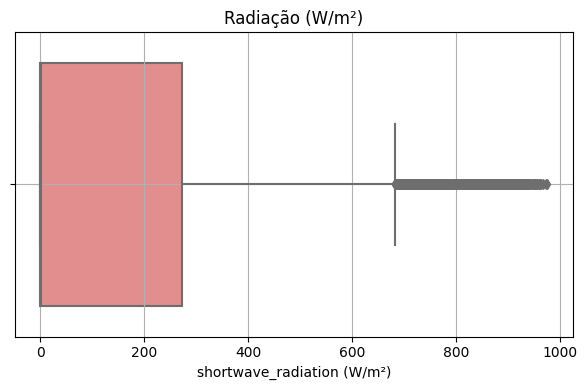

In [73]:
plt.figure(figsize=(6, 4))

# Plot the first boxplot
sns.boxplot(x=data['shortwave_radiation (W/m²)'], color='lightcoral')
plt.title('Radiação (W/m²)')
plt.grid(True)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

### Analisar os gráficos entre features

c:\Users\mgdsb\miniconda3\envs\envNAME\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mgdsb\miniconda3\envs\envNAME\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mgdsb\miniconda3\envs\envNAME\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
c:\Users\mgdsb\miniconda3\envs\envNAME\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a fu

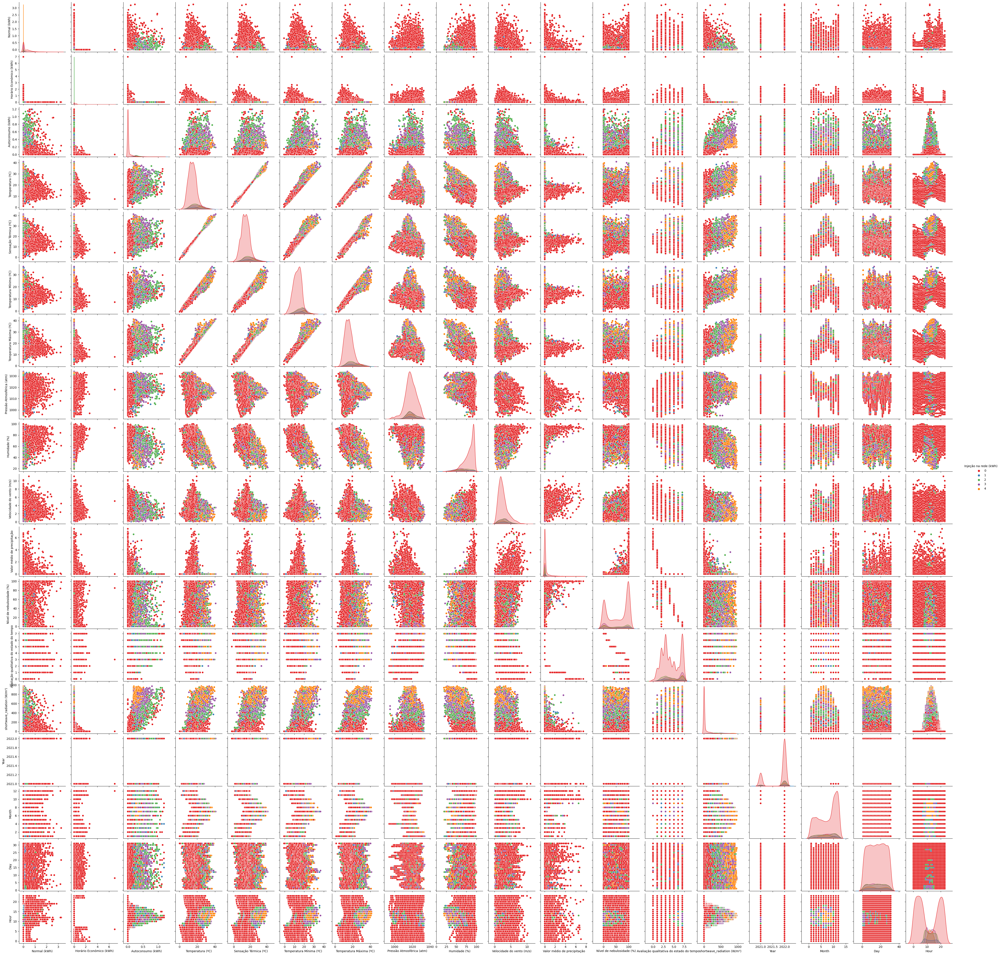

In [79]:
sns.pairplot(data, hue='Injeção na rede (kWh)', palette='Set1')

In [74]:
data['Avaliação qualitativa do estado do tempo'].value_counts()

Avaliação qualitativa do estado do tempo
sky is clear            3010
overcast clouds         2430
light rain              1662
broken clouds           1413
scattered clouds        1148
few clouds               731
moderate rain            562
heavy intensity rain      60
Name: count, dtype: int64

In [75]:
mapeamento = {'heavy intensity rain': 0, 'moderate rain': 1, 'light rain': 2, 'overcast clouds': 3, 'broken clouds': 4, 'scattered clouds': 5, 'few clouds': 6, 'sky is clear': 7}

# Substituir os valores no DataFrame
data['Avaliação qualitativa do estado do tempo'] = data['Avaliação qualitativa do estado do tempo'].replace(mapeamento)

In [76]:
data

,Normal (kWh),Horário Económico (kWh),Autoconsumo (kWh),Injeção na rede (kWh),Temperatura (ºC),Sensação Térmica (ºC),Temperatura Mínima (ºC),Temperatura Máxima (ºC),Pressão Atmosférica (atm),Humidade (%),Velocidade do vento (m/s),Valor médio de precipitação,Nível de nebulosidade (%),Avaliação qualitativa do estado do tempo,shortwave_radiation (W/m²),Year,Month,Day,Hour
0,0.000,0.000,0.0,None,13.97,13.54,11.45,14.04,1027,81,1.96,0.00,87,3,0.0,2021,9,29,0
1,0.000,0.000,0.0,None,13.48,13.02,13.43,13.90,1028,82,1.83,0.00,91,3,0.0,2021,9,29,1
2,0.000,0.000,0.0,None,12.93,12.47,12.72,13.43,1027,84,1.96,0.00,93,3,0.0,2021,9,29,2
3,0.000,0.000,0.0,None,12.61,12.15,10.34,12.93,1027,85,1.85,0.00,95,3,0.0,2021,9,29,3
4,0.000,0.000,0.0,None,12.61,12.17,9.79,12.93,1027,86,1.83,0.00,93,3,0.0,2021,9,29,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11011,1.693,0.000,0.0,None,15.70,15.57,15.57,15.72,1018,86,5.56,3.58,100,1,0.0,2022,12,31,19
11012,1.327,0.000,0.0,None,15.55,15.43,12.72,15.70,1018,87,4.47,4.20,100,0,0.0,2022,12,31,20
11013,0.757,0.000,0.0,None,13.45,13.28,12.23,13.99,1019,93,3.29,4.23,100,0,0.0,2022,12,31,21
11014,0.000,0.675,0.0,None,12.93,12.73,12.23,13.43,1019,94,1.49,3.90,100,1,0.0,2022,12,31,22


In [77]:
mapeamento = {'None': 0, 'Low': 1, 'Medium': 2, 'High': 3, 'Very High': 4}

data['Injeção na rede (kWh)'] = data['Injeção na rede (kWh)'].replace(mapeamento)

<Axes: >

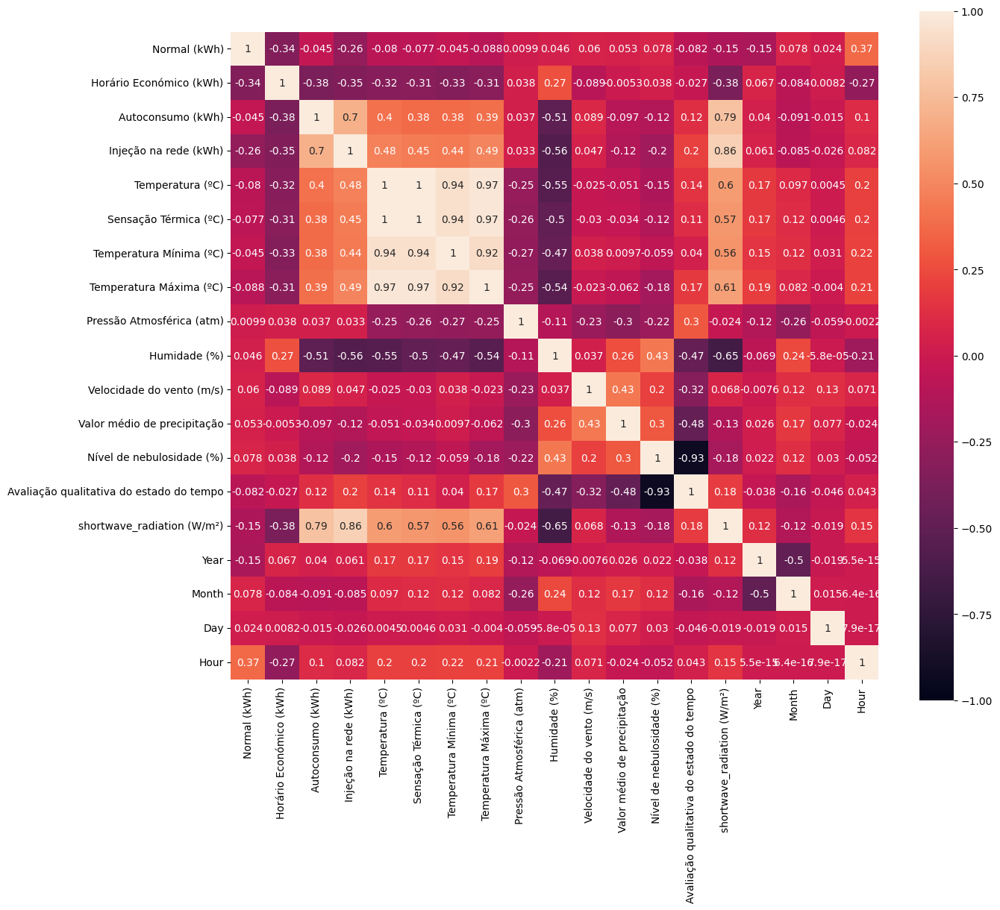

In [78]:
corr_matrix = data.corr(method='pearson', numeric_only=True)
f, ax = plt.subplots(figsize=(14, 12))
sns.heatmap(corr_matrix, vmin=-1, vmax=1, square=True, annot=True)